In [4]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
from skimage import transform
from PIL import Image
import matplotlib.pylab as plt

IMG_PATH = '/content/drive/MyDrive/couple.jpg'

 Mengubah citra menjadi inverse (negative) 
--------------------------------------------


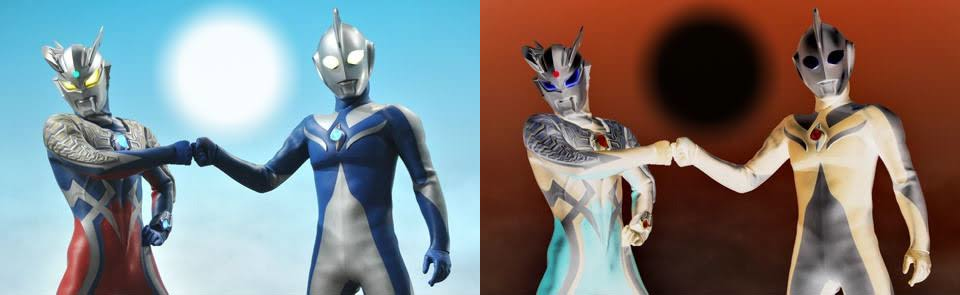

In [7]:
print(' Mengubah citra menjadi inverse (negative) ')
print('--------------------------------------------')

original = cv.imread(IMG_PATH)
inverse_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            inverse_image[y,x,c] = 255 - original[y,x,c]

final_frame = cv.hconcat((original, inverse_image))
cv2_imshow(final_frame)

 Mengubah kontras dan tingkat kecerahan citra 
------------------------------------------------
Masukkan tingkat kecerahan : 30
Masukkan kontras : 40


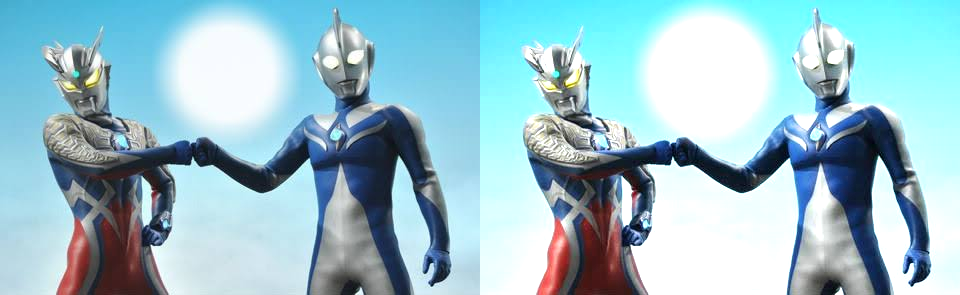

In [6]:
print(' Mengubah kontras dan tingkat kecerahan citra ')
print('------------------------------------------------')
try:
    brightness = int(input('Masukkan tingkat kecerahan : '))
    contrast = float(input('Masukkan kontras : '))
except ValueError:
    print('Error, not a number')

original = cv.imread(IMG_PATH)
contrast_image = np.zeros(original.shape, original.dtype)

factor = (259 * (contrast + 255)) / (255 * (259 - contrast))

#akses per piksel, OpenCV membaca dalam urutan BGR
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        colour = original[y, x]

        blue  = colour[0]
        green = colour[1]
        red   = colour[2]

        #cast ke int dulu supaya perhitungan tidak overflow sebelum di-clip
        redBaru   = np.clip(factor * (int(red)   - 128) + 128 + brightness, 0, 255)
        greenBaru = np.clip(factor * (int(green) - 128) + 128 + brightness, 0, 255)
        blueBaru  = np.clip(factor * (int(blue)  - 128) + 128 + brightness, 0, 255)

        contrast_image[y, x] = [blueBaru, greenBaru, redBaru]

final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)

Mengubah tingkat kecerahan citra
Masukkan nilai kecerahan : 30


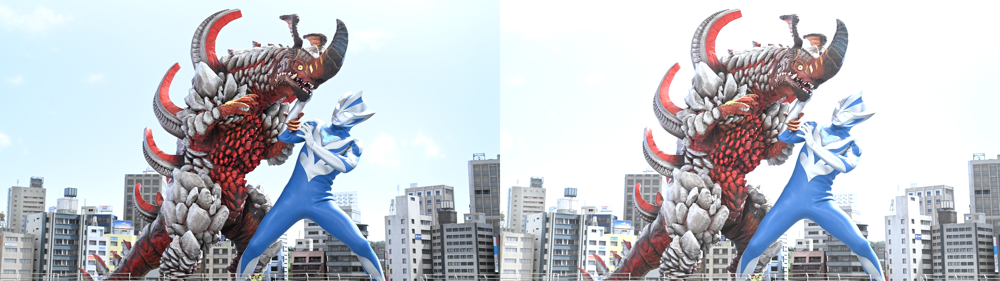

In [ ]:
print('Mengubah tingkat kecerahan citra')

try:
  brightness = int(input('Masukkan nilai kecerahan : '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/VIaloga-vs-Teo.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      pixel = int(original[y,x,c]) + brightness
      brightness_image[y,x,c] = np.clip(pixel, 0, 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

 Mengubah tingkat kecerahan citra dengan Transformasi Log 
-------------------------------------------------------
Masukkan nilai kecerahan: 50


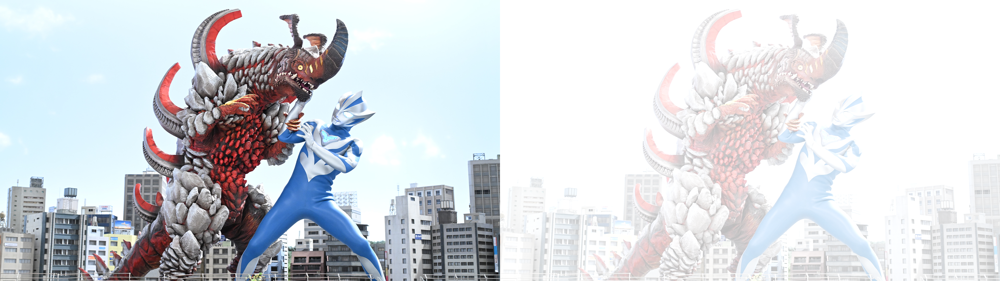

In [ ]:
print(' Mengubah tingkat kecerahan citra dengan Transformasi Log ')
print('-------------------------------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/VIaloga-vs-Teo.jpg')
log_image = np.zeros(original.shape, original.dtype)

#tambahkan brightness dulu (dengan truncate) sebelum transformasi log
r_max = np.max(np.clip(original.astype(int) + brightness, 0, 255))
c = 255 / np.log(1 + r_max)

#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):
            r = np.clip(int(original[y, x, ch]) + brightness, 0, 255)
            log_image[y, x, ch] = np.clip(c * np.log(1 + r), 0, 255)

final_frame = cv.hconcat((original, log_image))
cv2_imshow(final_frame)

In [7]:
print(' Mengubah citra menjadi grayscale ')
print('------------------------------------')

original = cv.imread(IMG_PATH)

#a. averaging
gray_avg = np.zeros(original.shape[:2], original.dtype)

#b. lightness
gray_lightness = np.zeros(original.shape[:2], original.dtype)

#c. luminance
gray_luminance = np.zeros(original.shape[:2], original.dtype)

#akses per piksel, OpenCV membaca dalam urutan BGR
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        blue  = int(original[y, x, 0])
        green = int(original[y, x, 1])
        red   = int(original[y, x, 2])

        gray_avg[y, x] = (red + green + blue) / 3
        gray_lightness[y, x] = (max(red, green, blue) + min(red, green, blue)) / 2
        gray_luminance[y, x] = 0.21 * red + 0.72 * green + 0.07 * blue

original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)


 Mengubah citra menjadi grayscale 
------------------------------------


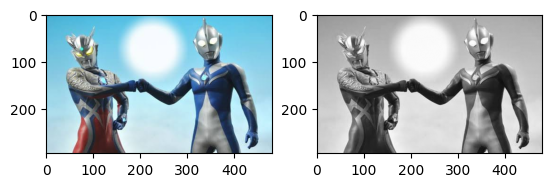

In [8]:
# a. Averaging
plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.subplot(1, 2, 2)
plt.imshow(gray_avg, cmap='gray')
plt.show()

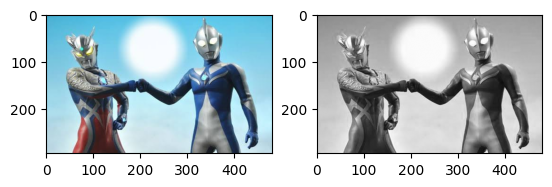

In [9]:
# b. Lightness
plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.subplot(1, 2, 2)
plt.imshow(gray_lightness, cmap='gray')
plt.show()

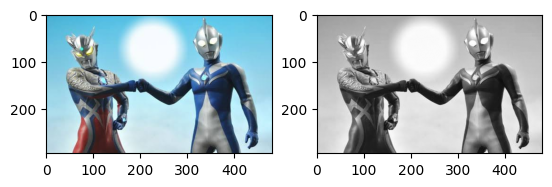

In [10]:
# c. Luminance
plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.subplot(1, 2, 2)
plt.imshow(gray_luminance, cmap='gray')
plt.show()

 Menampilkan warna tertentu, bagian lain grayscale 
------------------------------------------------------


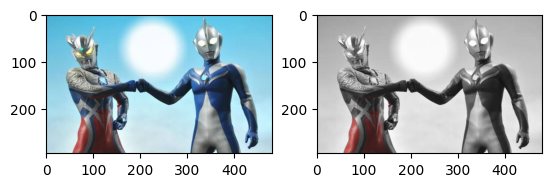

In [11]:
print(' Menampilkan warna tertentu, bagian lain grayscale ')
print('------------------------------------------------------')

original = cv.imread(IMG_PATH)
hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

result_image = np.zeros(original.shape, original.dtype)

#rentang Hue untuk warna merah (merah berada di 2 ujung skala Hue)
lower_red1, upper_red1 = np.array([0, 70, 50]),   np.array([10, 255, 255])
lower_red2, upper_red2 = np.array([170, 70, 50]), np.array([180, 255, 255])

#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        h, s, v = hsv[y, x]
        is_red = (lower_red1[0] <= h <= upper_red1[0] or lower_red2[0] <= h <= upper_red2[0]) \
                 and lower_red1[1] <= s <= 255 and lower_red1[2] <= v <= 255

        if is_red:
            result_image[y, x] = original[y, x]
        else:
            blue  = int(original[y, x, 0])
            green = int(original[y, x, 1])
            red   = int(original[y, x, 2])
            gray = 0.21 * red + 0.72 * green + 0.07 * blue
            result_image[y, x] = [gray, gray, gray]

original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
result_rgb = cv.cvtColor(result_image, cv.COLOR_BGR2RGB)

plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.subplot(1, 2, 2)
plt.imshow(result_rgb)
plt.show()

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3.6


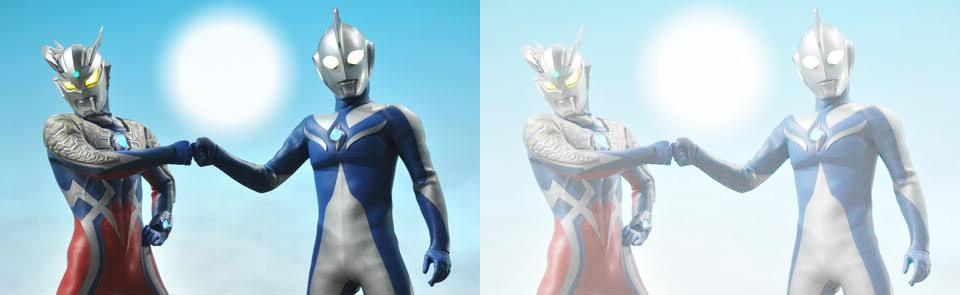

In [13]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

original = cv.imread(IMG_PATH)
gamma_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            I = original[y, x, c]
            gamma_image[y, x, c] = np.clip(255 * (I / 255) ** (1 / gamma), 0, 255)

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

Masukkan bit depth tujuan (1-8): 
5
Bit depth awal  : 8 bit
Bit depth tujuan: 5 bit
Jumlah level    : 32


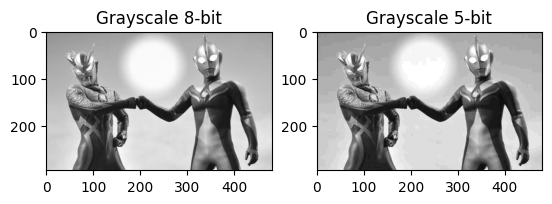

In [14]:
print('Masukkan bit depth tujuan (1-8): ')
try:
    bit_depth = int(input())
except ValueError:
    print('Error, not a number')

level = 255 / (pow(2, bit_depth) - 1)

original = cv.imread('/content/drive/MyDrive/couple.jpg', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        C = original[y, x]
        depth_image[y, x] = round((C / level)) * level

print(f'Bit depth awal  : 8 bit')
print(f'Bit depth tujuan: {bit_depth} bit')
print(f'Jumlah level    : {pow(2, bit_depth)}')

plt.subplot(1, 2, 1)
plt.imshow(original, cmap='gray')
plt.title('Grayscale 8-bit')
plt.subplot(1, 2, 2)
plt.imshow(depth_image, cmap='gray')
plt.title(f'Grayscale {bit_depth}-bit')
plt.show()

In [19]:
print(' Membuat 100 citra dengan Gaussian Noise ')
print('-------------------------------------------')

original = cv.imread(IMG_PATH)

import os
output_folder = '/content/drive/MyDrive/noises'
os.makedirs(output_folder, exist_ok=True)

mean = 0
sigma = 25  # semakin besar sigma, semakin "kasar" noise-nya

for i in range(100):
    noise = np.random.normal(mean, sigma, original.shape)
    noisy_image = np.clip(original.astype(np.float64) + noise, 0, 255).astype(np.uint8)
    cv.imwrite(f'{output_folder}/noise_{i+1}.jpg', noisy_image)

print('Selesai, 100 citra noise tersimpan di', output_folder)

 Membuat 100 citra dengan Gaussian Noise 
-------------------------------------------
Selesai, 100 citra noise tersimpan di /content/drive/MyDrive/noises


In [20]:
# Percobaan 6
from math import log10, sqrt
import glob

def PSNR(img1, img2):
    mse = np.mean((img1.astype(np.float64) - img2.astype(np.float64)) ** 2)
    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

In [21]:
original = cv.imread(IMG_PATH)

cv_img = []
for img in glob.glob('/content/drive/MyDrive/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

print(f'Jumlah citra noise terbaca: {len(cv_img)}')

Jumlah citra noise terbaca: 100


Jumlah citra di average =  10  ->  PSNR = 31.97 dB


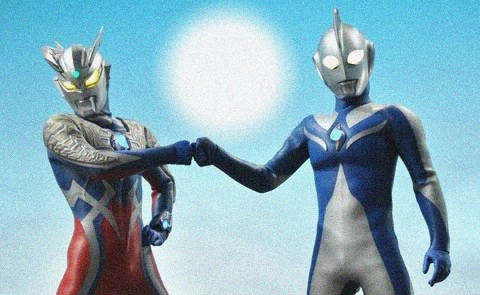

Jumlah citra di average =  20  ->  PSNR = 33.66 dB


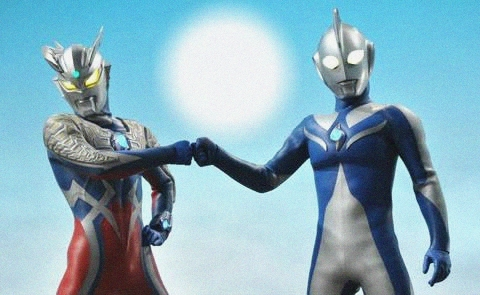

Jumlah citra di average =  40  ->  PSNR = 34.82 dB


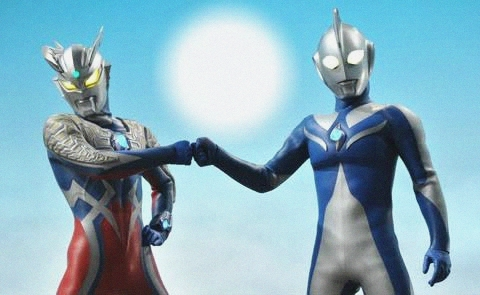

Jumlah citra di average =  80  ->  PSNR = 35.56 dB


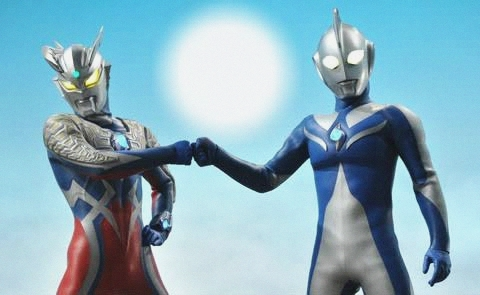

Jumlah citra di average = 100  ->  PSNR = 35.72 dB


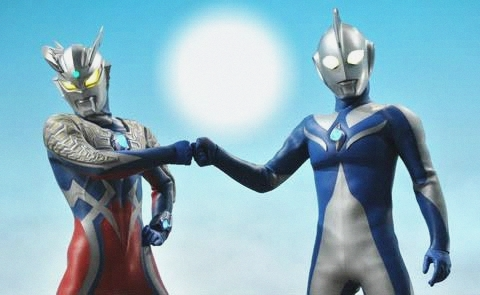

In [22]:
def average_image(cv_img, jumlah):
    target_shape = cv_img[0].shape[:2]  # (height, width) acuan dari citra pertama
    hasil = np.zeros(cv_img[0].shape, dtype=np.float64)

    for i in range(jumlah):
        img = cv_img[i]
        # samakan ukuran dulu kalau berbeda dari citra acuan
        if img.shape[:2] != target_shape:
            img = cv.resize(img, (target_shape[1], target_shape[0]))
        hasil += img.astype(np.float64)

    hasil = hasil / jumlah
    return np.clip(hasil, 0, 255).astype(np.uint8)

jumlah_list = [10, 20, 40, 80, 100]

for jumlah in jumlah_list:
    denoised = average_image(cv_img, jumlah)
    # Resize the original image to match the denoised image's dimensions for PSNR calculation
    original_resized = cv.resize(original, (denoised.shape[1], denoised.shape[0]))
    nilai_psnr = PSNR(original_resized, denoised)
    print(f'Jumlah citra di average = {jumlah:3d}  ->  PSNR = {nilai_psnr:.2f} dB')
    cv2_imshow(denoised)

 Image Masking dengan operator logika 
------------------------------------------
1. NOT (komplemen)


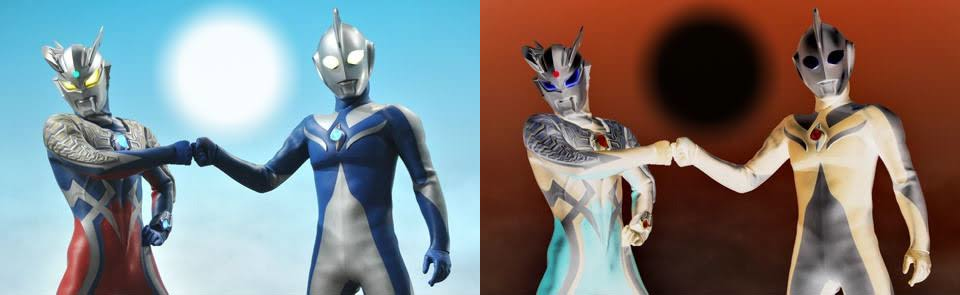

2. OR (Atau)


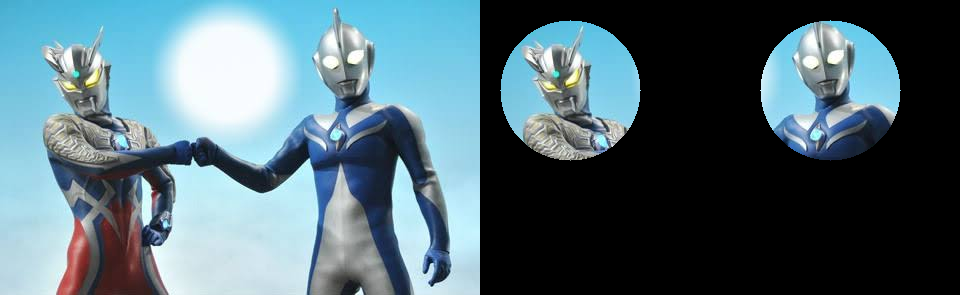

3. AND (Dan)


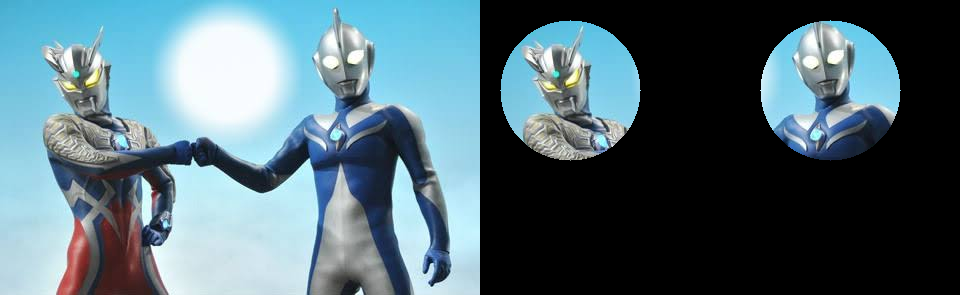

4. NAND (Not And)


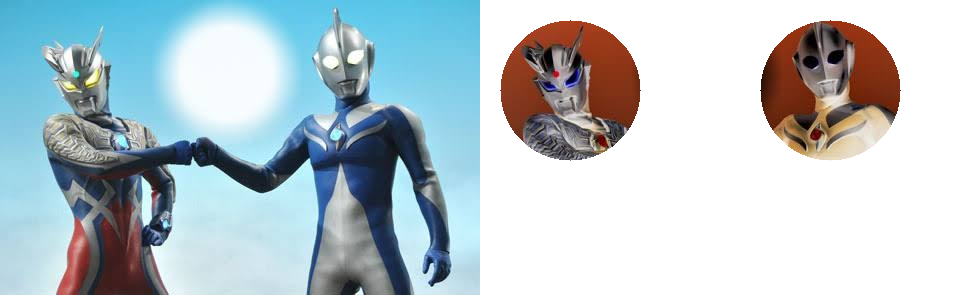

5. XOR (Exclusive Or)


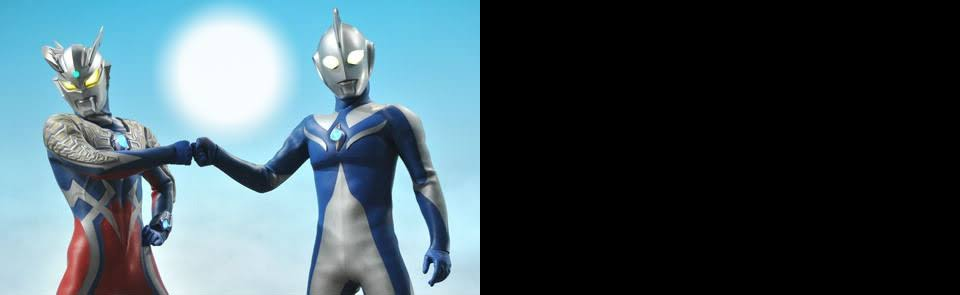

In [ ]:
print(' Image Masking dengan operator logika ')
print('------------------------------------------')

original = cv.imread('/content/drive/MyDrive/couple.jpg')

#buat mask: 2 lingkaran putih (foreground) di atas background hitam
mask = np.zeros(original.shape[:2], dtype=np.uint8)
cv.circle(mask, (90, 90), 70, 255, -1)
cv.circle(mask, (350, 90), 70, 255, -1)

not_result  = cv.bitwise_not(original)
or_result   = cv.bitwise_or(original, original, mask=mask)
and_result  = cv.bitwise_and(original, original, mask=mask)
nand_result = cv.bitwise_not(and_result)
xor_result  = cv.bitwise_xor(original, original, mask=mask)

print('1. NOT (komplemen)')
cv2_imshow(cv.hconcat((original, not_result)))

print('2. OR (Atau)')
cv2_imshow(cv.hconcat((original, or_result)))

print('3. AND (Dan)')
cv2_imshow(cv.hconcat((original, and_result)))

print('4. NAND (Not And)')
cv2_imshow(cv.hconcat((original, nand_result)))

print('5. XOR (Exclusive Or)')
cv2_imshow(cv.hconcat((original, xor_result)))

 Gamma Correction pada foto malam hari 
-------------------------------------------
Masukkan nilai Gamma: 3.5


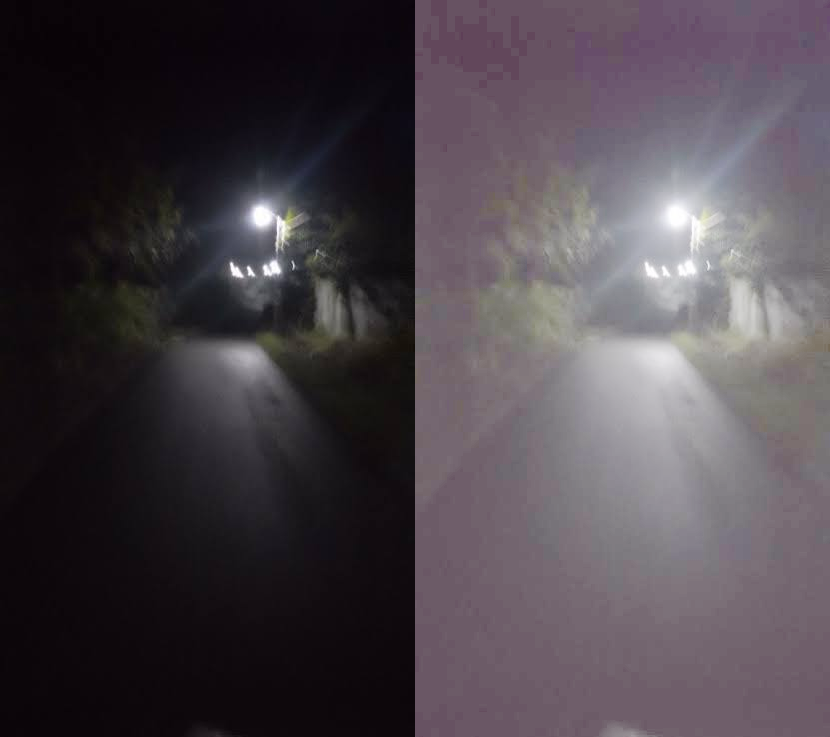

In [ ]:
print(' Gamma Correction pada foto malam hari ')
print('-------------------------------------------')
try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/gelap2.jpg')
gamma_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            I = original[y, x, c]
            gamma_image[y, x, c] = np.clip(255 * (I / 255) ** (1 / gamma), 0, 255)

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

 Perbaikan citra crayfish.jpg (Gamma + Contrast) 
------------------------------------------------------


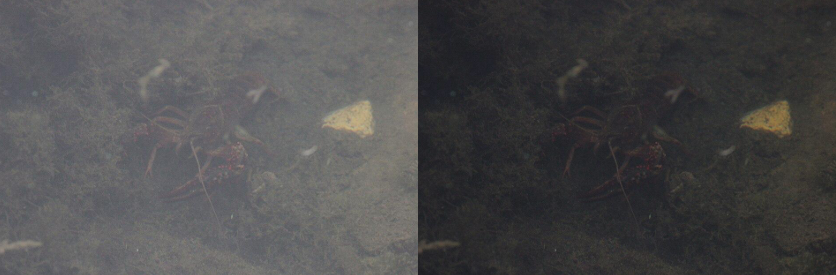

In [ ]:
print(' Perbaikan citra crayfish.jpg (Gamma + Contrast) ')
print('------------------------------------------------------')

gamma = 0.5
contrast = 2.3
brightness = 3

#sesuaikan dengan file dan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/crayfish.png')
result_image = np.zeros(original.shape, original.dtype)

factor = (259 * (contrast + 255)) / (255 * (259 - contrast))

#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            I = original[y, x, c]

            #1) gamma correction dulu
            gamma_val = 255 * (I / 255) ** (1 / gamma)

            #2) lalu contrast + brightness
            hasil = factor * (gamma_val - 128) + 128 + brightness
            result_image[y, x, c] = np.clip(hasil, 0, 255)

final_frame = cv.hconcat((original, result_image))
cv2_imshow(final_frame)
